In [52]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.graphics.mosaicplot import mosaic
from pandas.plotting import parallel_coordinates
import plotly.graph_objects as go
%matplotlib inline

In [53]:
# reading the data_file
df = pd.read_csv("adult_data.txt", header=None, sep=", ")
df.columns = ["age", "workclass", "fnlwgt", "education", "education-num", "marital-status", "occupation", "relationship", "race", "sex", "capital-gain", "capital-loss", "hours-per-week", "native-country", "salary"]

<ipython-input-53-6a28c6cfc5c0>:2: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



In [54]:
#  Replacing ? with the null values
df = df.replace('?', np.nan)
# Gives the count in each column with missing values
# df.isnull().sum()

In [55]:
#Dropping missing values records
count_beforedrop = df.shape[0]
df.dropna(inplace=True)
count_afterdrop = df.shape[0]
# print('Number of rows before dropping the missing values ',count_beforedrop)
# print('Number of rows after removing the missing data ',count_afterdrop)
# df.isnull().sum()

In [56]:
#Trying to find correlation between continous varaibles
# df[['age','education-num','capital-gain','capital-loss','hours-per-week']].corr()
# print(df)

In [57]:
#Selecting features
#Dropping columns fnlwgt,
#education similar to education-num Merging and created new
#Marital status or relationship -Choosing one
# df.drop(columns=['fnlwgt', 'education-num'])

In [58]:
# get a list of tuples to know the education to education-num relationship, this is enquire statement to make below conditions
# list_=[(i,k) for i,k in zip(df['education-num'].unique(),df.education.unique())]
# print(list_)

# Alternate to above Code 
# education_system = df[["education","education-num"]].drop_duplicates()
# print(education_system)

In [59]:
# There are 13 different categories in education, so reduced it to 7 categories by grouping different education levels
conditions = [(df['education-num'] >= 16) ,
              (df['education-num'] >= 14) & (df['education-num'] < 16),
              (df['education-num'] == 13) ,
              (df['education-num'] >= 10) & (df['education-num'] < 13),
              (df['education-num'] == 9) ,
              (df['education-num'] >= 7) & (df['education-num'] < 9),
              (df['education-num'] < 7)]
values = ['Advanced Degree','Graduate','Undergrad','Associate degree', 'High School Grad','High School Dropout',
          'Junior High and Elementary']

# Adding a new column education level to the existing dataset
df['education_levels'] = np.select(conditions, values)
# print(df)

# droping below three columns from the dataset, which is not required 
df.drop(columns=['education','education-num','fnlwgt'],inplace=True)
# print(df)

In [60]:
#Dividing the data based on income
df_above50 = df[df['salary']=='>50K']
df_below50 = df[df['salary']=='<=50K']

In [61]:
# Get Education level count 
count_education = df.groupby('education_levels').count()
# print(count_education)

In [62]:
count_education.index
# print(count_education.index)
list_edu = count_education['salary']
# print(list_edu)

Text(0.5, 1.0, 'Education distribution in salary more than 50k \n\n')

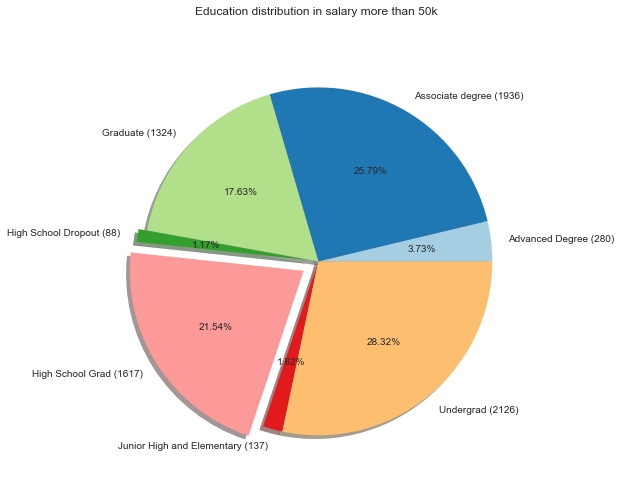

In [63]:
# Created By : Haritha Gurram
explode_ = (0, 0, 0, 0.05,0.1,0 ,0)
count_education = df_above50.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution in salary more than 50k \n\n')

Text(0.5, 1.0, 'Education distribution in salary less than 50k \n\n')

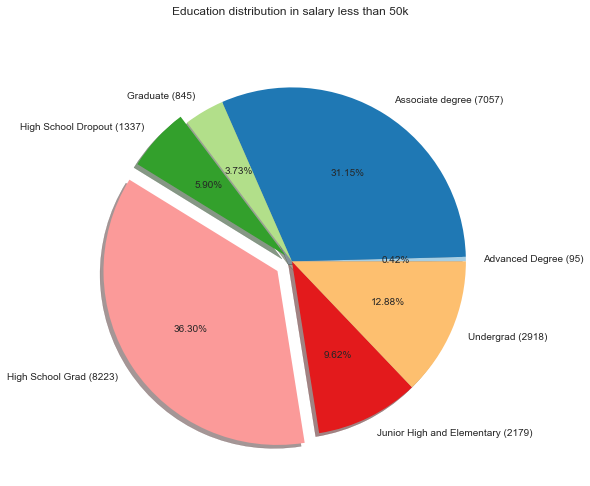

In [64]:
#  Created By : Haritha Gurram
#  Pie chart to show the that more % of people with high school degree are earning less than 50k
explode_ = (0, 0, 0, 0.05,0.1,0 ,0)
count_education = df_below50.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution in salary less than 50k \n\n')

Text(0.5, 1.0, 'Education distribution \n\n')

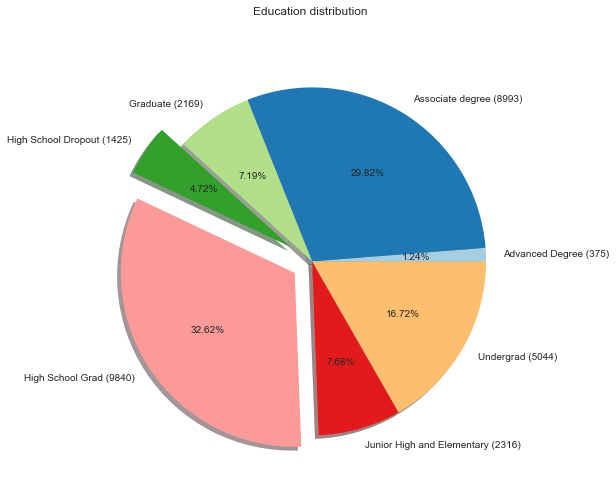

In [65]:
# Created By : Haritha Gurram
#  Pie chart to show the that more % of people with high school degree are earning less than 50k
explode_ = (0, 0, 0, 0.15,0.12,0 ,0)
count_education = df.groupby('education_levels').count()
fig = plt.figure(figsize=(20,8))
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_education.index,count_education['salary']) ]
plt.pie(count_education['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
plt.title('Education distribution \n\n')

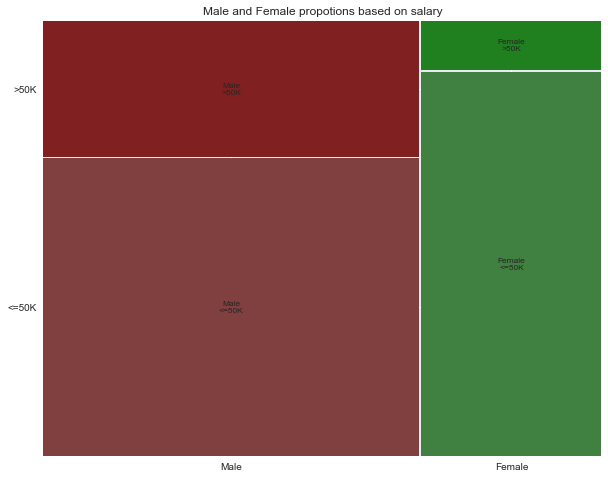

In [66]:
# 2.MOSAIC PLOT TO SEE THE DISTRIBUTION BASED ON SEX and Salary
fig, ax = plt.subplots(figsize=(10, 8))
mosaic(df, ['sex','salary'],ax=ax,title="Male and Female propotions based on salary")
plt.show()

Text(0, 0.5, 'Age')

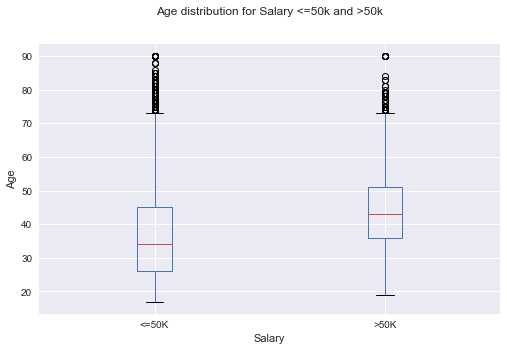

In [67]:
# 3. Box plot to show age distribution for salaries more than 50k and less than 50k

box_plot=df.boxplot(column='age', by='salary', figsize=(8,5))
box_plot.get_figure().suptitle('')
box_plot.get_figure().gca().set_title("Age distribution for Salary <=50k and >50k\n\n")
box_plot.get_figure().gca().set_xlabel('Salary')
box_plot.get_figure().gca().set_ylabel('Age')


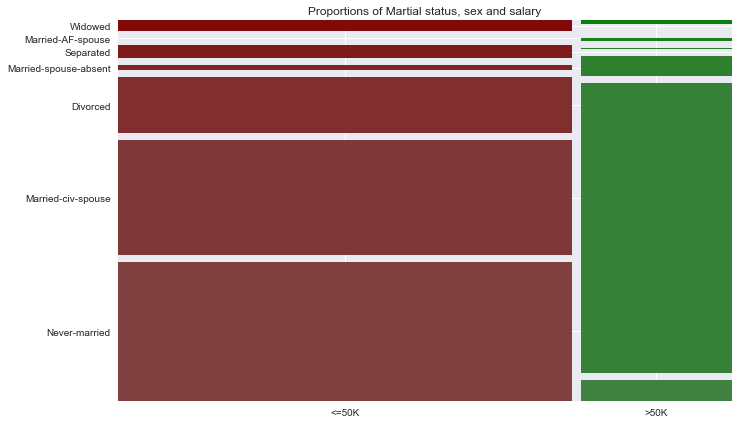

In [68]:
#4. Mosaic Plot to show the proportaions of Martial status, sex and salary
fig, ax = plt.subplots(figsize=(11, 7))
#labels = lambda key: 'Female' if 'Female' in key else 'Male'
mosaic(df,['salary','marital-status'],
       label_rotation=(0.0,0.0,0,90.0),
       ax=ax,
       axes_label=True,
       gap=[0.015,0.02, 0.015],
       labelizer=lambda key :" ",
       title='Proportions of Martial status, sex and salary')

plt.show()

Text(0.5, 0.98, 'Data distribution for hours per week')

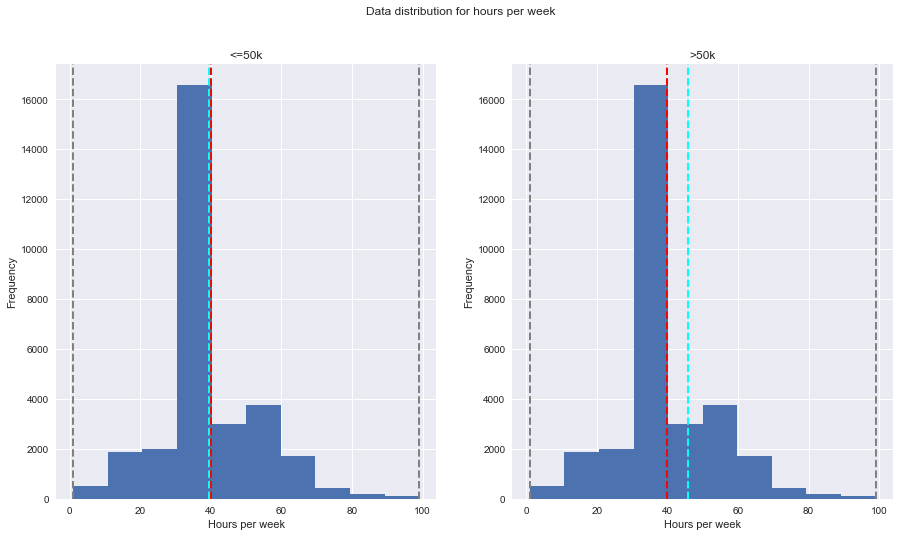

In [69]:
#5. Finding distribution for number of hours worked and salary
fig, ax = plt.subplots(1, 2, figsize = (15,8))

# Plot a histogram
ax[0].hist(df['hours-per-week'])

# Add lines for the statistics
ax[0].axvline(x=df_below50['hours-per-week'].min(), color = 'gray', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].mean(), color = 'cyan', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].median(), color = 'red', linestyle='dashed', linewidth = 2)
ax[0].axvline(x=df_below50['hours-per-week'].max(), color = 'gray', linestyle='dashed', linewidth = 2)

ax[0].set_ylabel('Frequency')
ax[0].set_xlabel('Hours per week')
ax[0].set_title('<=50k')
# Plot a histogram
ax[1].hist(df['hours-per-week'])

# Add lines for the statistics
ax[1].axvline(x=df_above50['hours-per-week'].min(), color = 'gray', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].mean(), color = 'cyan', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].median(), color = 'red', linestyle='dashed', linewidth = 2)
ax[1].axvline(x=df_above50['hours-per-week'].max(), color = 'gray', linestyle='dashed', linewidth = 2)

ax[1].set_ylabel('Frequency')
ax[1].set_title('>50k')
ax[1].set_xlabel('Hours per week')
fig.suptitle('Data distribution for hours per week')

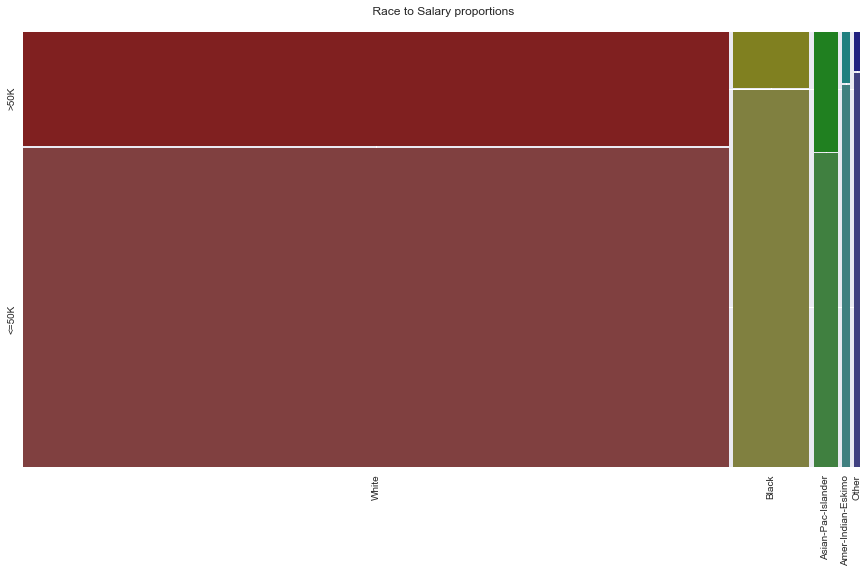

In [70]:
# 6. Race vs salary
fig, ax = plt.subplots(figsize=(15, 8))
mosaic(df, ['race','salary'],ax=ax,label_rotation=90.0,title=' Race to Salary proportions\n', labelizer= lambda k:" ")
plt.show()

Text(0.5, 0, 'Frequency')

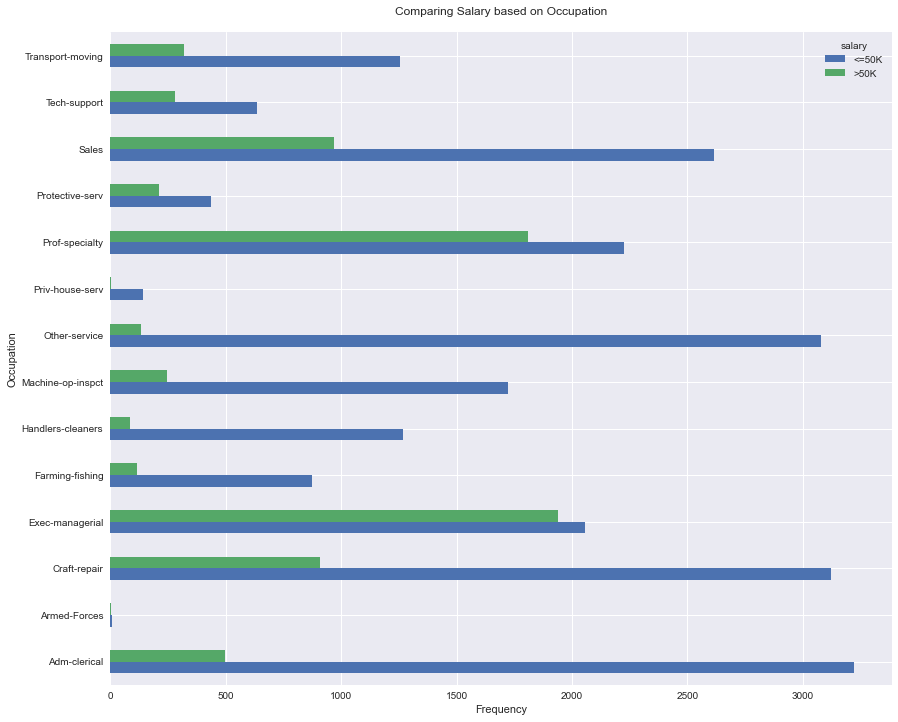

In [71]:
# 7. To compare the occupation distribution based on salary Grouped bar chart
df_1 = df.groupby(['occupation','salary']).size().to_frame('count')
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='barh', figsize=(14, 12))
plt.title("Comparing Salary based on Occupation\n")
plt.ylabel("Occupation")
plt.xlabel("Frequency")

Text(0, 0.5, 'Frequency')

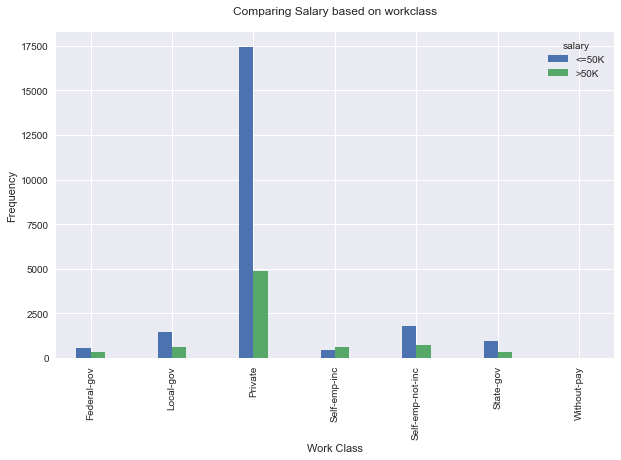

In [72]:
#8 Stacked bar charts to compare the
df_workclass = df.groupby(['workclass','salary']).size().to_frame('count')
df_workclass.reset_index().pivot_table(index="salary", columns="workclass",values="count").T.plot(kind='bar', width =0.35,figsize=(10, 6))

plt.title("Comparing Salary based on workclass\n")
plt.xlabel("Work Class")
plt.ylabel("Frequency")

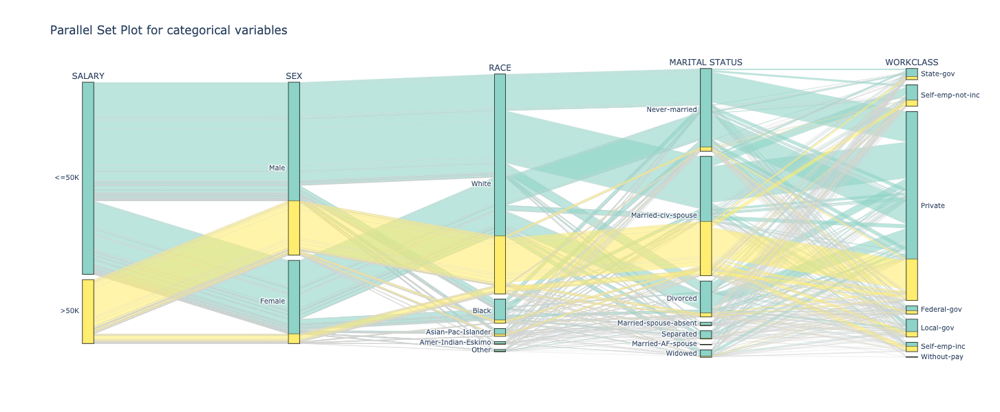

In [73]:
# 9. Shows relation between the categorical variables
# Can answer many demographic questions as this plot is an interactive graph
fig = px.parallel_categories(df, dimensions=['salary','sex','race','marital-status','workclass'],
                             color=df['salary'].apply(lambda x: 1 if x == '>50K' else 0),
                             color_continuous_scale=px.colors.qualitative.Set3,
                             width=800, height=600,
                             title="Parallel Set Plot for categorical variables",
                             labels={'salary':'SALARY', 'sex':'SEX','workclass': 'WORKCLASS', 'marital-status': 'MARITAL STATUS', 'race': 'RACE'})

fig.update_layout(coloraxis_showscale=False)
fig.show()


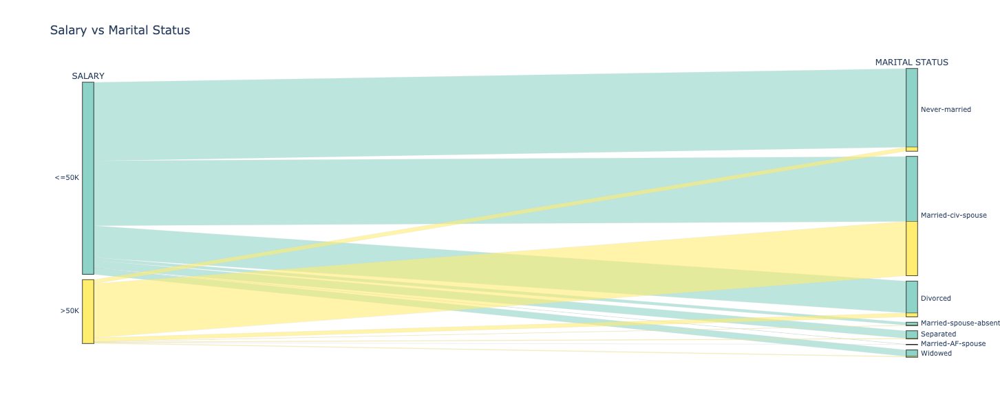

In [74]:
# 9. Shows relation between the categorical variables
# Can answer many demographic questions as this plot is an interactive graph
fig = px.parallel_categories(df, dimensions=['salary','marital-status'],
                             color=df['salary'].apply(lambda x: 1 if x == '>50K' else 0),
                             color_continuous_scale=px.colors.qualitative.Set3,
                             width=800, height=600,
                             title="Salary vs Marital Status",
                             labels={'salary':'SALARY','marital-status': 'MARITAL STATUS'})
fig.update_layout(coloraxis_showscale=False)
fig.show()

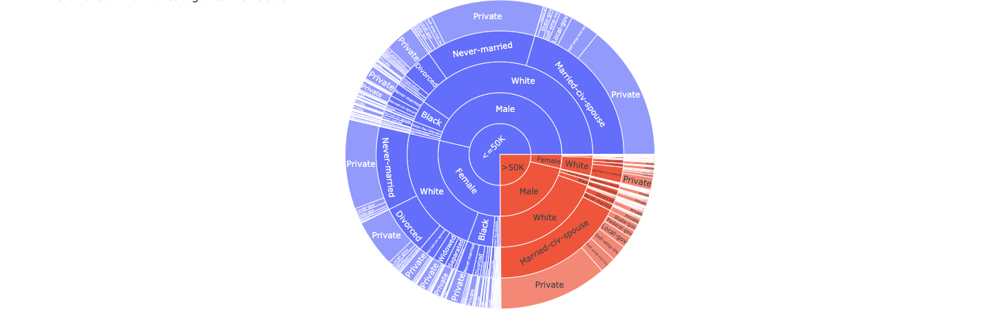

In [75]:
# Created: Arpan Saini
fig = px.sunburst(df, path=['salary','sex','race','marital-status','workclass'], color='salary', 
                  title='Parallel Set Plot for categorical variables')
# fig = px.colors.qualitative.swatches()      
fig.update_layout(
    margin = dict(t=0, l=0, r=0, b=0)
)
fig.show()
# fig.write_html('adult_sunburst.html', auto_open=True)

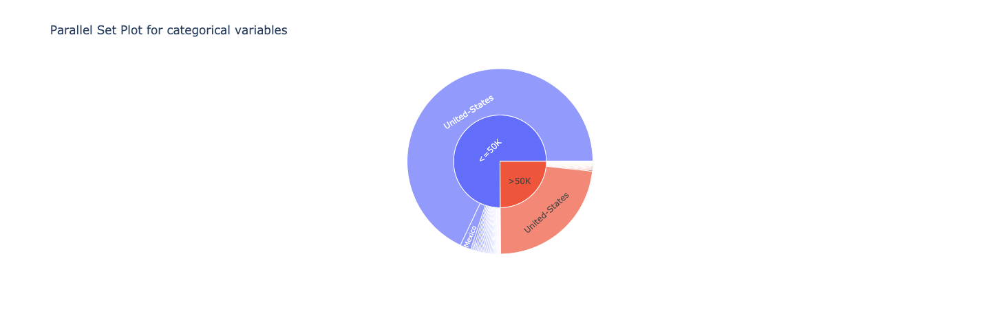

In [76]:
# Created: Arpan Saini
fig = px.sunburst(df, path=['salary','native-country'], color='salary', title="Parallel Set Plot for categorical variables")
# fig = px.colors.qualitative.swatches()      
# fig.update_layout(
#     margin = dict(t=0, l=50, r=20, b=30)
# )
fig.show()

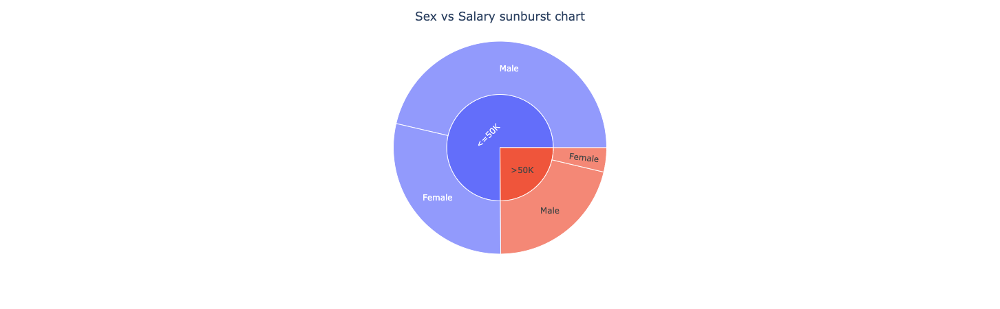

In [77]:
# Created: Arpan Saini
fig = px.sunburst(df, path=['salary','sex'], color='salary')
fig.update_layout(title_text='Sex vs Salary sunburst chart', title_x=0.5)
# fig.get_title().set_position((-10, 0))
# fig = px.colors.qualitative.swatches()      
# fig.update_layout(
#     margin = dict(t=0, l=50, r=20, b=30)
# )
fig.show()

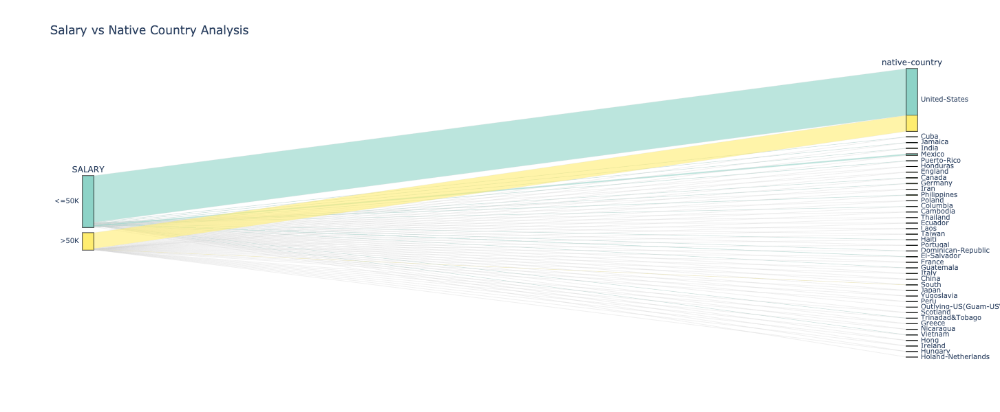

In [78]:
# Created: Arpan Saini
fig = px.parallel_categories(df, dimensions=['salary','native-country'],
                             color=df['salary'].apply(lambda x: 1 if x == '>50K' else 0),
                             color_continuous_scale=px.colors.qualitative.Set3,
                             width=800, height=600,
                             title="Salary vs Native Country Analysis",
                             labels={'salary':'SALARY','native-country': 'native-country'})

fig.update_layout(coloraxis_showscale=False)

fig.show()

In [79]:
df_1 = df.groupby(['occupation','salary']).size().to_frame('count')

<AxesSubplot:xlabel='occupation'>

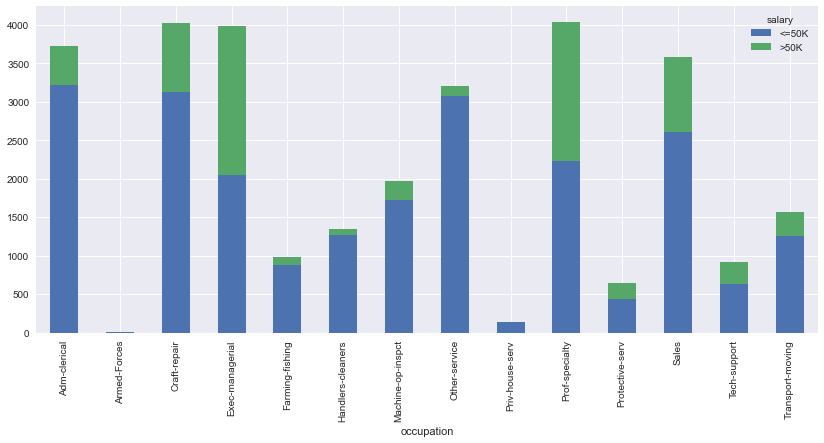

In [80]:
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='bar', stacked=True, figsize=(14, 6))

<AxesSubplot:ylabel='occupation'>

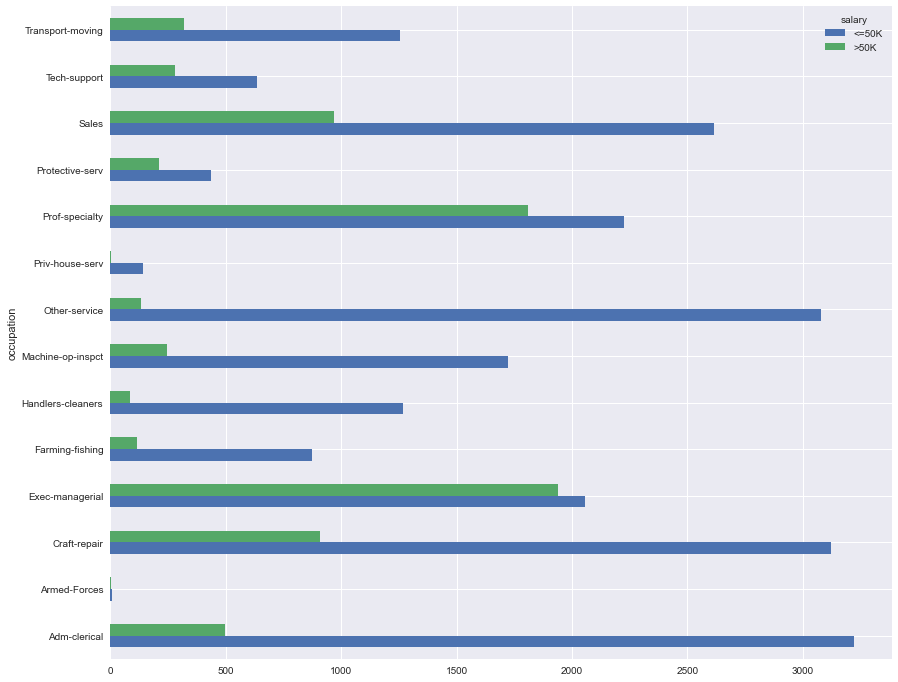

In [81]:
df_1.reset_index().pivot_table(index="salary", columns="occupation", values="count").T.plot(kind='barh', figsize=(14, 12))

Text(0.5, 0.98, 'Income distribution among Race')

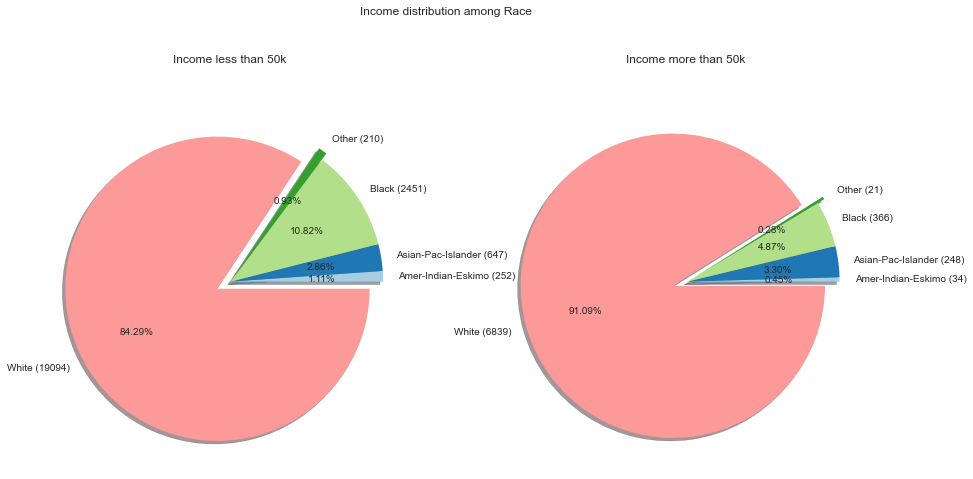

In [82]:
# 8. Pie plot to show the distribution of race in both the income groups
fig, ax = plt.subplots(1, 2, figsize = (15,8))
explode_ = (0, 0, 0, 0.05,0.1)
count_race = df_below50.groupby('race').count()

#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_race.index,count_race['salary']) ]
ax[0].pie(count_race['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
ax[0].set_title('Income less than 50k \n\n')

count_race = df_above50.groupby('race').count()
#colors_ = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#2b8cbe']
colors_pop =['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
labels_ = ["{} ({})".format(i,j) for i,j in zip(count_race.index,count_race['salary']) ]
ax[1].pie(count_race['salary'],labels=labels_,explode=explode_,colors=colors_pop, autopct='%1.2f%%',shadow=True)
ax[1].set_title('Income more than 50k \n\n')
fig.suptitle('Income distribution among Race')

Text(0, 0.5, 'Hours-per-week')

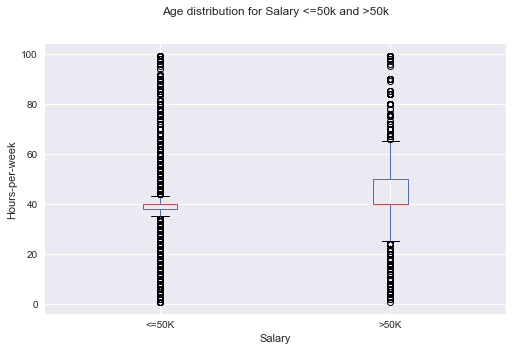

In [83]:
box_plot=df.boxplot(column='hours-per-week', by='salary', figsize=(8,5))
box_plot.get_figure().suptitle('')
box_plot.get_figure().gca().set_title("Age distribution for Salary <=50k and >50k\n\n")
box_plot.get_figure().gca().set_xlabel('Salary')
box_plot.get_figure().gca().set_ylabel('Hours-per-week')


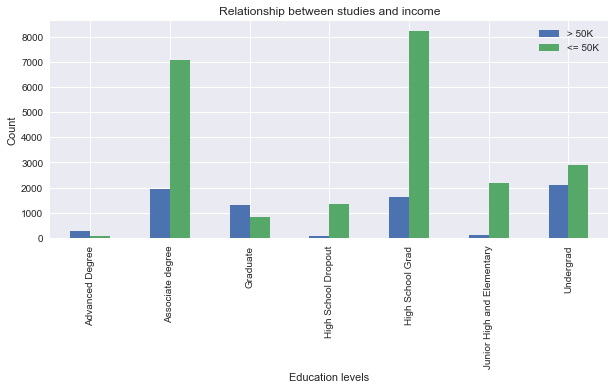

In [84]:
# Created By: Jonatan Sanchez Alvarez
import matplotlib as mpl

mpl.style.use('seaborn')

df['counts_above'] = 0
df['counts_below'] = 0

counts_above = df[df['salary']=='>50K'].groupby(['education_levels'])['counts_above'].count()
counts_below = df[df['salary']=='<=50K'].groupby(['education_levels'])['counts_below'].count()

plotdata = pd.DataFrame({
    "> 50K":counts_above,
    "<= 50K":counts_below
    }
)
plotdata.plot(kind="bar",figsize=(10,4))
# ax.set_title('style: seaborn'.format('seaborn'), color='C0')
plt.title("Relationship between studies and income")
plt.xlabel("Education levels")
plt.ylabel("Count")
plt.show()

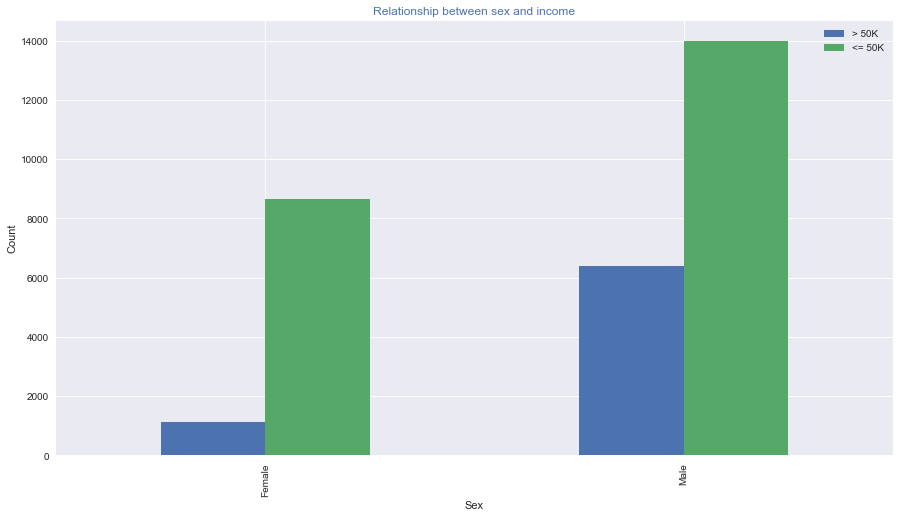

In [85]:
# Created By: Jonatan Sanchez Alvarez
import matplotlib as mpl

df['counts_above'] = 0
df['counts_below'] = 0

counts_above = df[df['salary']=='>50K'].groupby(['sex'])['counts_above'].count()
counts_below = df[df['salary']=='<=50K'].groupby(['sex'])['counts_below'].count()
plotdata = pd.DataFrame({
    "> 50K":counts_above,
    "<= 50K":counts_below
    }
)
ax = plotdata.plot(kind="bar",figsize=(15,8))
mpl.style.use('seaborn')
ax.set_title('style: seaborn'.format('seaborn'), color='C0')
plt.title("Relationship between sex and income")
plt.xlabel("Sex")
plt.ylabel("Count")
plt.show()


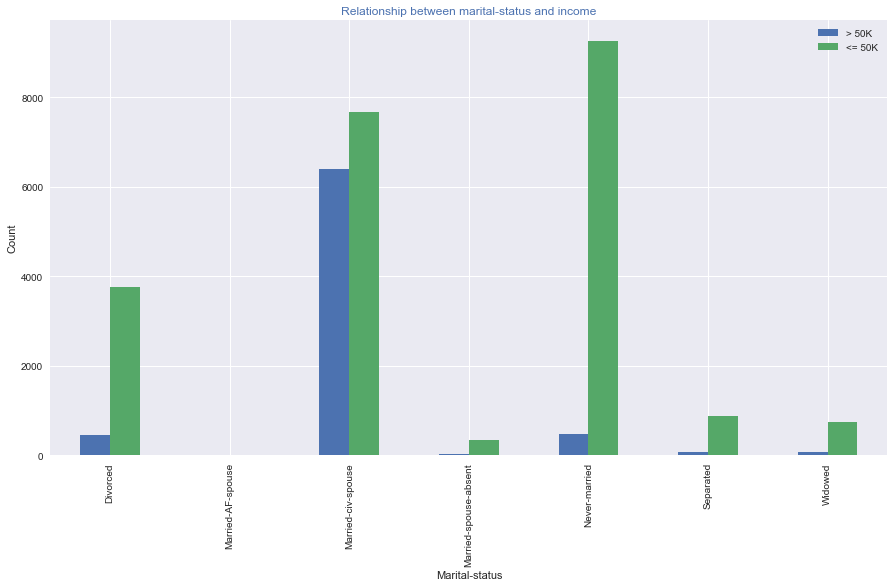

In [86]:
# Created By: Jonatan Sanchez Alvarez
import matplotlib as mpl

df['counts_above'] = 0
df['counts_below'] = 0

counts_above = df[df['salary']=='>50K'].groupby(['marital-status'])['counts_above'].count()
counts_below = df[df['salary']=='<=50K'].groupby(['marital-status'])['counts_below'].count()
plotdata = pd.DataFrame({
    "> 50K":counts_above,
    "<= 50K":counts_below
    }
)
ax = plotdata.plot(kind="bar",figsize=(15,8))
mpl.style.use('seaborn')
ax.set_title('style: seaborn'.format('seaborn'), color='C0')
plt.title("Relationship between marital-status and income")
plt.xlabel("Marital-status")
plt.ylabel("Count")
plt.show()


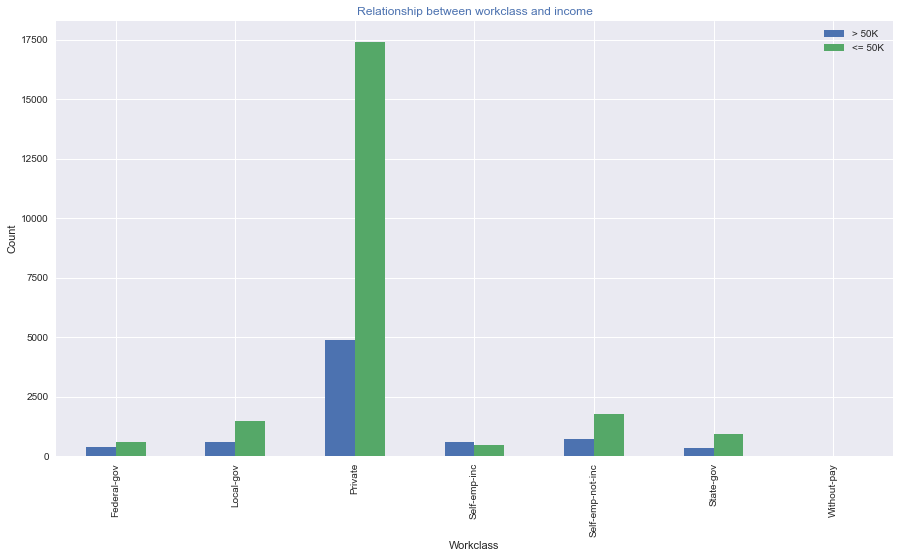

In [87]:
# Created By: Jonatan Sanchez Alvarez
import matplotlib as mpl

df['counts_above'] = 0
df['counts_below'] = 0

counts_above = df[df['salary']=='>50K'].groupby(['workclass'])['counts_above'].count()
counts_below = df[df['salary']=='<=50K'].groupby(['workclass'])['counts_below'].count()
plotdata = pd.DataFrame({
    "> 50K":counts_above,
    "<= 50K":counts_below
    }
)
ax = plotdata.plot(kind="bar",figsize=(15,8))
mpl.style.use('seaborn')
ax.set_title('style: seaborn'.format('seaborn'), color='C0')
plt.title("Relationship between workclass and income")
plt.xlabel("Workclass")
plt.ylabel("Count")
plt.show()


<ipython-input-88-5ff368b3858c>:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-88-5ff368b3858c>:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-88-5ff368b3858c>:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-88-5ff3

Accuracy: 0.8215272405790696


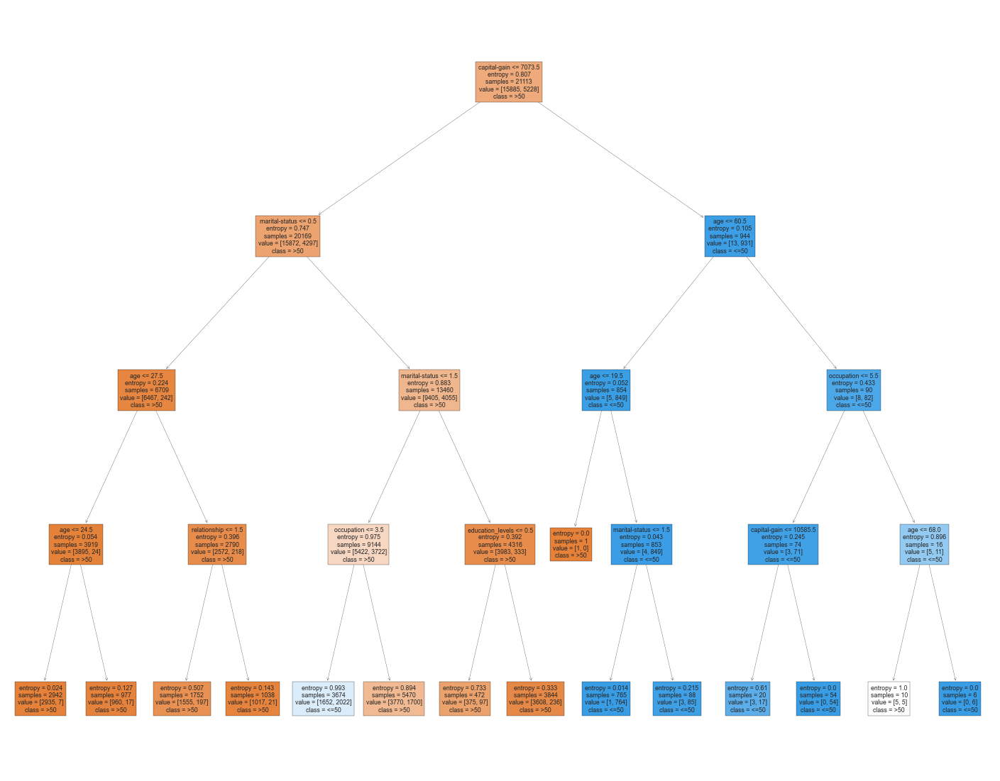

In [88]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import tree # Import Decision Tree Classifier

workclass = {'State-gov':0, 'Self-emp-not-inc':1, 'Private':2, 'Federal-gov':3, 'Local-gov':4,
 'Self-emp-inc':5, 'Without-pay':6}
marital_status = {'Never-married':0, 'Married-civ-spouse':1, 'Divorced':2, 'Married-spouse-absent':3,
 'Separated':4, 'Married-AF-spouse':5, 'Widowed':6}
occupation= {'Adm-clerical':0, 'Exec-managerial':1, 'Handlers-cleaners':2, 'Prof-specialty':3,
 'Other-service':4, 'Sales':5, 'Transport-moving':6, 'Farming-fishing':7,
 'Machine-op-inspct':8, 'Tech-support':9, 'Craft-repair':10, 'Protective-serv':11,
 'Armed-Forces':12, 'Priv-house-serv':13}
relationship = {'Not-in-family':0, 'Husband':1, 'Wife':2, 'Own-child':3, 'Unmarried':4, 'Other-relative':5}
sex = {'Male':0, 'Female':1}
race = {'White':0, 'Black':1, 'Asian-Pac-Islander':2, 'Amer-Indian-Eskimo':3, 'Other':4}
education_levels = {'Undergrad':0, 'High School Grad':1, 'High School Dropout':2, 'Graduate':3,
 'Junior High and Elementary':4, 'Associate degree':5, 'Advanced Degree':6}


feature_cols = ['age', 'workclass', 'marital-status', 'occupation','relationship','capital-gain','sex', 'race','education_levels']
string_cols =['workclass', 'marital-status', 'occupation', 'relationship','sex','race']


X = df[feature_cols] # Features
X['workclass'] =  X['workclass'].map(workclass)
X['marital-status'] =  X['marital-status'].map(marital_status)
X['occupation'] =  X['occupation'].map(occupation)
X['relationship'] =  X['relationship'].map(relationship)
X['sex'] =  X['sex'].map(sex)
X['race'] =  X['race'].map(race)
X['education_levels'] =  X['education_levels'].map(education_levels)

y = df['salary'] # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#text_representation = tree.export_text(clf)
#print(text_representation)
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf, 
                   feature_names=feature_cols,  
                   class_names=['>50','<=50'],
                   filled=True)
plt.show()
fig.savefig("decistion_tree.png")


<ipython-input-93-bcbfffaa43ea>:6: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



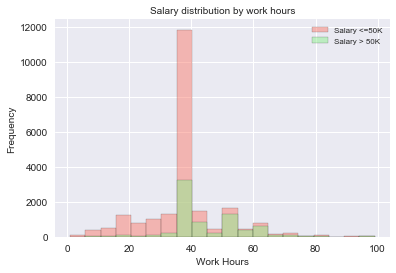

In [93]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

# reading the data_file
df = pd.read_csv("adult_data.txt", header=None, sep=", ")
df.columns = ["age", "workclass", "fnlwgt", "education", "education-num", "marital-status", "occupation", 
                              "relationship", "race", "sex", "capital-gain", "capital-loss", "hours-per-week", "native-country", "salary"]
df = df.replace('?', np.nan)
# Gives the count in each column with missing values
df.isnull().sum()
# print(df)
count_beforedrop = df.shape[0]
df.dropna(inplace=True)
count_afterdrop = df.shape[0]
below_50 = df['salary'].str.contains('<=50K')
above_50 = df['salary'].str.contains('>50K')
plt.figure(figsize=(6,4))
plt.style.use('seaborn-darkgrid')
plt.hist(df[below_50]['hours-per-week'], bins=20, alpha=0.5,edgecolor='black',color='salmon', label="Salary <=50K")
plt.hist(df[above_50]['hours-per-week'], bins=20, alpha=0.5,edgecolor='black',color='lightgreen', label="Salary > 50K")
plt.xlabel("Work Hours", size=10)
plt.ylabel("Frequency", size=10)
plt.title("Salary distribution by work hours",fontsize=10)
plt.legend(loc='upper right', fontsize= 8, fancybox=True)
plt.savefig("salary_distribution_by_work_hours_v1.png",dpi=1200,bbox_inches="tight")